In [94]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
%matplotlib inline
import librosa
import librosa.display
import pylab
import os
import matplotlib.image as mpimg

from sklearn.mixture import GaussianMixture

## WHY USE SHORT-TIME FOURIER TRANSFORM?
Musical signals are highly non-stationary, i.e., their statistics change over time. It would be rather meaningless to compute a single Fourier transform over an entire 10-minute song.

The short-time Fourier transform (STFT) (Wikipedia; FMP, p. 53) is obtained by computing the Fourier transform for successive frames in a signal.

X(m,ω)=∑nx(n)w(n−m)e−jωn

As we increase  m , we slide the window function  w  to the right. For the resulting frame,  x(n)w(n−m) , we compute the Fourier transform. Therefore, the STFT  X  is a function of both time,  m , and frequency,  ω .


### Doubt?? mel spectogram uses FFT 

In [42]:
# load mp3 audio file
audio_path = 'music.mp3'

# librosa.load takes in any audio format and returns audio time series array
# and sampling rate
y_rap_1, sr_rap = librosa.load(audio_path, mono =True, offset = 0.0, duration = 60)
y_rap_2, sr_rap = librosa.load(audio_path, mono =True, offset = 60.0, duration = 60)
y_rap_3, sr_rap = librosa.load(audio_path, mono =True, offset = 120.0, duration = 60)
y_rap_4, sr_rap = librosa.load(audio_path, mono =True, offset = 180.0, duration = 60)
 

In [51]:
# sr_rap_2
y_rap_5, sr_rap = librosa.load(audio_path, mono =True, offset = 240.0, duration = 60)

0

In [47]:
ipd.Audio(y_rap_1, rate=sr_rap)

In [40]:
ipd.Audio(y_rap_2, rate=sr_rap)

In [41]:
ipd.Audio(y_rap_3, rate=sr_rap)

In [43]:
ipd.Audio(y_rap_4, rate=sr_rap)

### Mel Spectrogram

##### librosa.feature.melspectrogram

INPUT - If a time-series input y, sr is provided
Internal Steps :
* y's magnitude spectrogram S is first computed
* then mapped onto the mel scale by mel_f.dot(S**power). By default, power=2 operates on a power spectrum. 


Other Parameters
* n_fft:  length of FFT window
* hop_length:  number of samples between successive frames
* power: 1(energy) or 2(power) and so on...



In [17]:
S = librosa.feature.melspectrogram(y, sr=sr, n_fft=4096, hop_length=256)

## DOUBT- Which one to use dB or power spectogram?

In [18]:
# converts dB scale spectogram to power spectogram
# logS = librosa.logamplitude(S, ref=np.max)
# 0-80 dB
logS = librosa.power_to_db(S, ref=np.max)

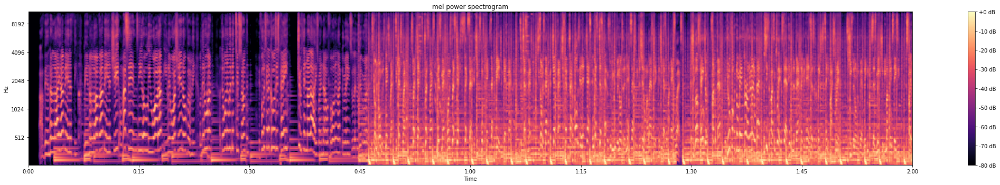

In [19]:
plt.figure(figsize=(30,5))

librosa.display.specshow(logS, sr=sr, x_axis='time', y_axis='mel')

plt.title('mel power spectrogram')

plt.colorbar(format='%+02.0f dB')

plt.tight_layout()

The human perception of sound intensity is logarithmic in nature. Therefore, we are often interested in the log amplitude:

In [20]:
# save spectrogram as image
# taking dB spectogram as of now

import pylab
save_path = 'dBspec.jpg'
pylab.figure(figsize=(30,5))

pylab.axis('off') # no axis
pylab.axes([0., 0., 1., 1.], frameon=False, xticks=[], yticks=[]) # Remove the white edge

S = librosa.feature.melspectrogram(y, sr=sr, n_fft=4096, hop_length=256)
logS = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(logS, sr=sr, x_axis='time', y_axis='mel')
pylab.savefig(save_path, bbox_inches=None, pad_inches=0)
pylab.close()

In [21]:
data = np.array([mpimg.imread(save_path) ], dtype=np.float64)
data.shape

(1L, 360L, 2160L, 3L)

In [95]:
logS.shape 

(128L, 5168L)

# BEGIN FROM HERE!!

## TAKING WHOLE SONG AT THE SAME TIME WITH 1 MIN SECTIONS

In [96]:
audio_path = 'music.mp3'
duration = 60
offset = 0
n_components=10
covariance_type = 'tied'

In [93]:
def train_sample_audio(duration, audio_path, showcase = False):
    offset = 0
    count = 0
    
    while(True):
        # load sampled audio
        y_rap, sr_rap = librosa.load(audio_path, mono =True, offset = offset, duration = duration)
        
        # in case the song ends
        if(y_rap.size == 0):
            break
        
        print "AUDIO PART",count+1,":\n Starting point:", offset,"  Ending point:", offset + duration
       
        # Spectrogram
        S_rap = librosa.feature.melspectrogram(y_rap, sr=sr_rap, n_fft=4096, hop_length=256)
        logS_rap = librosa.power_to_db(S_rap, ref=np.max)
        
        # Apply Guassian Mixture model
        gmm_rap = GaussianMixture(n_components = n_components, covariance_type = covariance_type)
        gmm_rap.fit(logS)
        
        # Move to next audio slice
        offset = offset + duration
        
        
        # If successful print DONE
        print " Done!"
        count += 1
        
    print("GMM TRAINING SUCCESSFUL!")
                    
        
train_sample_audio(duration, audio_path, showcase = True)

AUDIO PART 1 :
 Starting point: 0   Ending point: 60
 Done!
AUDIO PART 2 :
 Starting point: 60   Ending point: 120
 Done!
AUDIO PART 3 :
 Starting point: 120   Ending point: 180
 Done!
AUDIO PART 4 :
 Starting point: 180   Ending point: 240
 Done!
GMM TRAINING SUCCESSFUL!


In [ ]:
y_rap, sr_rap = librosa.load('music2.mp3', mono =True, offset = offset, duration = duration)

In [105]:
def test_sample_audio(duration, audio_path):
    offset = 0
    count = 0
    
    while(True):
        # load sampled audio
        y, sr = librosa.load(audio_path, mono =True, offset = offset, duration = duration)
        
        # in case the song ends
        if(y.size == 0):
            break
        
        print "AUDIO PART",count+1,":\n Starting point:", offset,"  Ending point:", offset + duration
       
        # Spectrogram
        S = librosa.feature.melspectrogram(y, sr=sr, n_fft=4096, hop_length=256)
        logS = librosa.power_to_db(S, ref=np.max)
        
        # Apply Guassian Mixture model
#         gmm_rap = GaussianMixture(n_components = n_components, covariance_type = covariance_type)
#         gmm_rap.fit(logS)
        score = gmm.score(logS)
        print "SCORE",score
        
        # Move to next audio slice
        offset = offset + duration
        
        
        # If successful print DONE
        print " Done!"
        count += 1
        
    print("GMM TESTING SUCCESSFUL!")
                    
        
test_sample_audio(60,'music3.mp3')


## WILL FIX THE ERROR IN A BIT

AUDIO PART 1 :
 Starting point: 0   Ending point: 60
SCORE -312877612607.0
 Done!
AUDIO PART 2 :
 Starting point: 60   Ending point: 120
SCORE -308939739139.0
 Done!
AUDIO PART 3 :
 Starting point: 120   Ending point: 180
SCORE -330787667976.0
 Done!
AUDIO PART 4 :
 Starting point: 180   Ending point: 240
SCORE -315723780402.0
 Done!
AUDIO PART 5 :
 Starting point: 240   Ending point: 300


ValueError: Expected the input data X have 5168 features, but got 1658 features

In [106]:
# y, sr = librosa.load('music3.mp3', mono =True)
# ipd.Audio(y, rate=sr)

In [ ]:
## IGNORE BELOW

In [ ]:
S = librosa.feature.melspectrogram(y, sr=sr, n_fft=4096, hop_length=256)
logS = librosa.power_to_db(S, ref=np.max)

In [ ]:
##### 

In [69]:
# data

In [24]:
from sklearn.mixture import GaussianMixture

In [44]:
gmm_rap = GaussianMixture(n_components=10, covariance_type = 'tied')

In [26]:
gmm_rap.fit(logS)


GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
        means_init=None, n_components=5, n_init=1, precisions_init=None,
        random_state=None, reg_covar=1e-06, tol=0.001, verbose=0,
        verbose_interval=10, warm_start=False, weights_init=None)